### Dependencies

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

In [2]:
cv.__version__, np.__version__

('4.9.0', '1.24.3')

### Reading an Image

- By default, OPENCV, deals with images in BGR format and matplotlib in RGB format. So, you need to convert the image into RGB format if you wanna deal it using matplotlib.

Text(0.5, 1.0, 'RGB format')

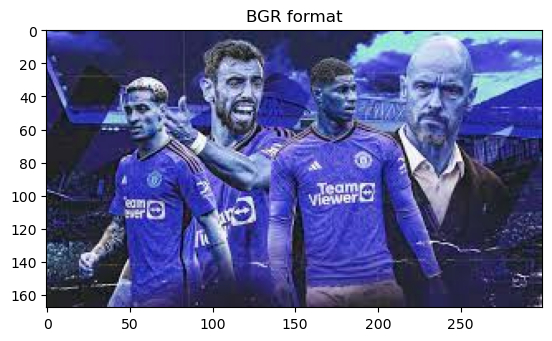

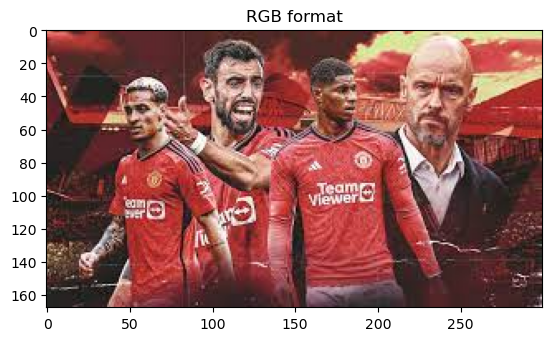

In [3]:
img1 = cv.imread("./assets/ManUnited.jpg")

plt.imshow(img1)
plt.title("BGR format")
plt.figure()
plt.imshow(cv.cvtColor(img1,cv.COLOR_BGR2RGB))
plt.title("RGB format")

In [4]:
img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)

- But what exactly is this image?

In [5]:
img1

# Looks like a 3-d array.

array([[[147,  73,  48],
        [144,  70,  45],
        [137,  61,  38],
        ...,
        [219, 236, 158],
        [214, 231, 153],
        [210, 227, 149]],

       [[226, 141, 121],
        [221, 136, 116],
        [209, 122, 103],
        ...,
        [222, 240, 164],
        [218, 236, 160],
        [215, 233, 157]],

       [[226, 122, 111],
        [228, 124, 113],
        [231, 124, 114],
        ...,
        [210, 232, 157],
        [207, 229, 154],
        [205, 227, 152]],

       ...,

       [[ 37,  39,  36],
        [ 37,  39,  36],
        [ 37,  37,  35],
        ...,
        [ 33,  14,  18],
        [ 95,  76,  82],
        [100,  81,  87]],

       [[ 37,  39,  36],
        [ 37,  39,  36],
        [ 37,  37,  35],
        ...,
        [ 43,  24,  28],
        [106,  87,  93],
        [150, 131, 137]],

       [[ 37,  39,  36],
        [ 37,  39,  36],
        [ 37,  37,  35],
        ...,
        [149, 130, 134],
        [175, 156, 162],
        [238, 219, 225]]

In [6]:
#Let's confirm whether the array is numpy array or not.
isinstance(img1,np.ndarray)

True

In [7]:
img1.dtype, img1.shape, img1.ndim

(dtype('uint8'), (168, 300, 3), 3)

__So we can manipulate our images just like numpy arrays.__

### Color, Grayscale & Binary Images

In [8]:
# Check if image is RGB or Grayscale!
print("Color Image") if img1.shape[2] == 3 else print("Grayscale Image")

Color Image


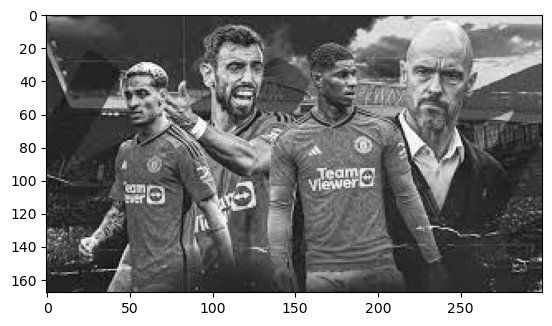

In [9]:
# Convert color image to grayscale
img1_gray = cv.cvtColor(img1, cv.COLOR_RGB2GRAY)
plt.imshow(img1_gray, cmap="gray")

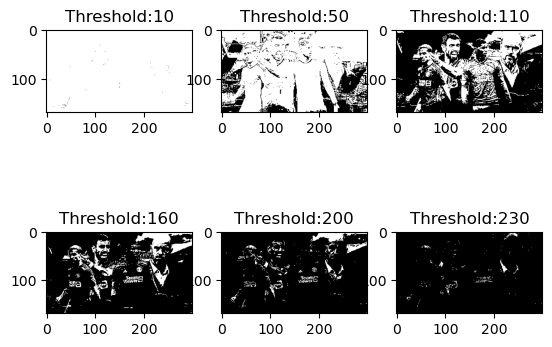

In [10]:
# Convert Grayscale image to Binary Image
thresholds = [10, 50, 110, 160, 200, 230]

for index, threshold in enumerate(thresholds):
    _, img_bin = cv.threshold(img1_gray,threshold,255,cv.THRESH_BINARY)
    plt.subplot(2,3,index+1)
    plt.imshow(img_bin, cmap="gray")
    plt.title(f"Threshold:{threshold}")

### Colormaps

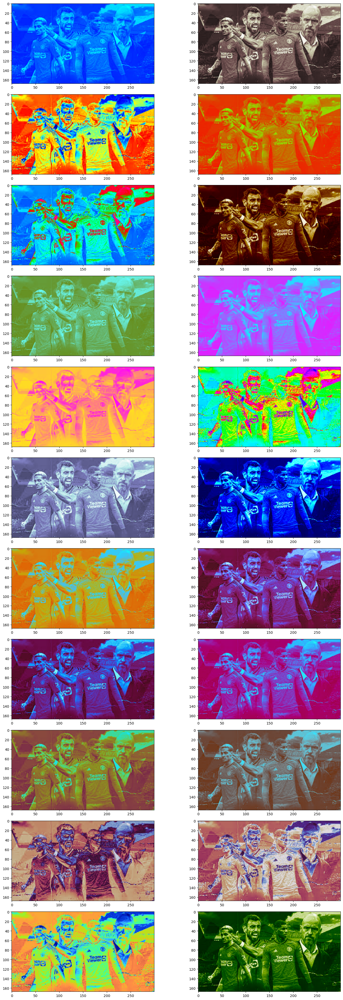

In [11]:
# OpenCV provides us a variety of colormap that we can apply to our image.
fig, axes = plt.subplots(11, 2, figsize=(20, 40), tight_layout=True)
axes = axes.flatten()
for i,ax in enumerate(axes):
    img_cmap=cv.applyColorMap(img1_gray,i)
    ax.imshow(img_cmap)

### Resizing

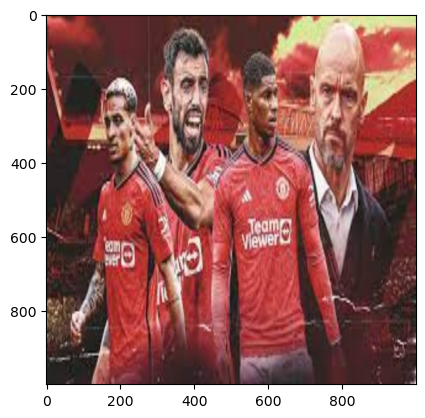

In [12]:
# We can upscale or downscale our images using cv.resize
img1_upscaled = cv.resize(img1,(1000,1000))
plt.imshow(img1_upscaled)

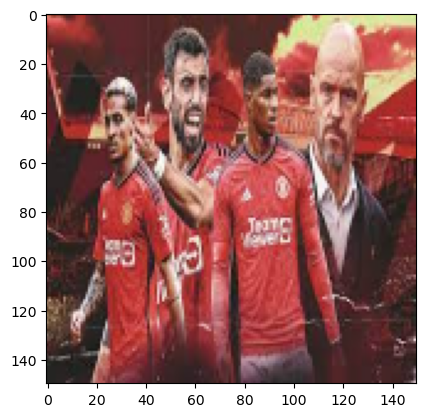

In [13]:
img1_downscaled = cv.resize(img1,(150,150),interpolation=cv.INTER_AREA)
plt.imshow(img1_downscaled)

### Cropping

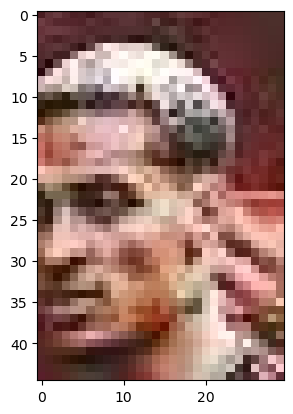

In [14]:
# Since images are just numpy arrays there we can crop them using slicing.

cropped_img = img1[25:70,50:80:]
plt.imshow(cropped_img)

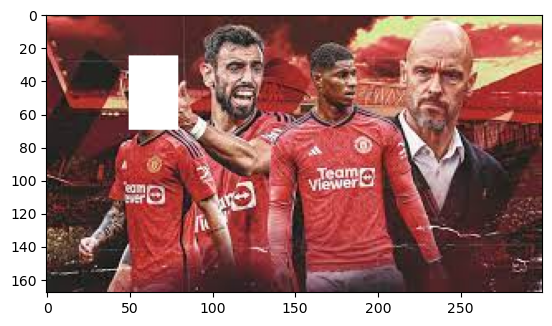

In [15]:
# We can even manipulate the original image using slicing
img2=img1.copy()
img2[25:70,50:80,:] = 255
plt.imshow(img2)